# But du projet

Les données viennent du dataset [ISPRS Potsdam](https://www2.isprs.org/commissions/comm2/wg4/benchmark/2d-sem-label-potsdam/). Le but est de classifier les images au niveau du pixel selon 4 classes: Routes, Batiments, Végétation et Autre. Nous considérons avoir 80% du jeu de données pour l'entraînement et 20% pour l'évaluation. 

Les images étant trop grosses pour être traitées directement par des réseaux de neurones, il faudra découper les images en tuiles pour pouvoir les traiter correctement. Vous pouvez aussi sous-échantilloner les données et observer l'effet de ce sous-échantillonage sur les performances. 

Une information géométrique est également disponible (hauteur via le DSM), vous pourrez tester son utilité pour améliorer les prédictions.

De nombreuses architectures de réseaux de neurones existent pour la segmentation sémantique; vous pouvez en tester quelques unes différentes en essayant de comprendre les différences entre celles-ci.

Le code fourni permet de charger les données, de les séparer en un jeu d'entrainement et un de validation, de les visualiser et de calculer les métriques à partir de vos futures prédictions. À vous de tester des architectures, différents pré-processing (différents tuilages ou augmentations de données) et d'analyser vos résultats !

Les commentaires #TODO peuvent vous donner des pistes sur ce qu'il faut faire.


# Import and seeds

In [1]:
import colorsys
import itertools
import os
import sys
from glob import glob
from os.path import join

import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.optim as optim
from sklearn.metrics import confusion_matrix, jaccard_score
from sklearn.model_selection import train_test_split
from torch import nn
from tqdm import tqdm
import torch.optim as optim
import copy

import segmentation_models_pytorch as smp
# Set seeds for reproducibility
np.random.seed(40)
torch.manual_seed(7)
torch.backends.cudnn.deterministic = True

# Google collab

In [2]:


TD_DIR = 'Potsdam-data'
sys.path.append(TD_DIR)
print(os.path.exists(TD_DIR))

True


# On instancie les variables globales

In [21]:
DATA_FOLDER = "./Potsdam/30cm"  # ou sont les données
BATCH_SIZE = 4
N_CLASSES = 4 
WINDOW_SIZE = 512
OVERLAP = 0.95
LENGTH_EPOCH = 16000
DEVICE = "cuda"

# Dataloader d'entrainement

In [4]:
def get_random_pos(img, window_shape):
    W, H = img.shape[-2:]
    x1 = np.random.randint(0, W - window_shape - 1)
    x2 = x1 + window_shape
    y1 = np.random.randint(0, H - window_shape - 1)
    y2 = y1 + window_shape
    return x1, x2, y1, y2

class Potsdam_train_dataset(torch.utils.data.Dataset):
    def __init__(self, img_files, cache=False,):
        super(Potsdam_train_dataset, self).__init__()
        
        self.cache = cache
        
        # List of files
        self.img_files = img_files
        self.gt_files = [i.replace("imgs", "gts") for i in self.img_files]
        # Initialize cache dicts
        self.data_cache_ = {}
        self.label_cache_ = {}
    
    def __len__(self):
        return LENGTH_EPOCH

    def data_augmentation(self, img, gt):
        #TODO ...
        return img, gt
    
    def __getitem__(self, i):
        # Pick a random image
        random_idx = np.random.randint(0, len(self.img_files) - 1)
        
        # If the tile hasn't been loaded yet, put in cache
        if random_idx in self.data_cache_.keys() and random_idx in self.label_cache_.keys():
            data = self.data_cache_[random_idx]
            label = self.label_cache_[random_idx]
        else:
            # Data is normalized in [0, 1]
            data = 1/255 * cv.imread(self.img_files[random_idx])[..., ::-1].transpose((2, 0, 1)) # OpenCV reads imags in BGR
            label = cv.imread(self.gt_files[random_idx], 0)
            if self.cache:
                self.data_cache_[random_idx] = data
                self.label_cache_[random_idx] = label

        # Get a random patch
        x1, x2, y1, y2 = get_random_pos(data, WINDOW_SIZE)
        data_p = data[:, x1:x2,y1:y2]
        label_p = label[x1:x2,y1:y2]
        
        # Data augmentation
        data_p, label_p = self.data_augmentation(data_p, label_p)

        # Return the torch.Tensor values
        return torch.from_numpy(data_p), torch.from_numpy(label_p)

# Fonctions pour la visualisation

In [27]:
# Utils to visualize data
def visualize(image, target, pred = [], comparison = False):
  if pred  == []:
    # Si l'on n'a pas encore produit de prédiction pour cet exemple, on affiche
    # seulement l'exemple et ses classes réelles
    colors = get_colors(N_CLASSES)
    plt.figure(figsize=(20,20))
    plt.subplot(1,2,1)
    plt.title("Image satellite")
    plt.imshow(image)
    plt.subplot(1,2,2)
    plt.title("Target")
    plt.imshow(apply_mask(image, target, colors))
    plt.show()
  else :
    # Si l'on a produit une prédiction, on affiche :
    colors = get_colors(N_CLASSES)
    plt.figure(figsize=(20,20))
    # La photo satellite :
    plt.subplot(2,2,1)
    plt.title("Image satellite")
    plt.imshow(image)
    if comparison :
        # L'image avec un masque, avec pour chaque pixel la couleur
        # verte si la prédiction est bonne
        # rouge si la prédiction est erronnée.
        test = target-pred
        f1 = np.vectorize(lambda x : 1 if x == 0 else 0)
        new_mask = f1(test)
        plt.subplot(2,2,2)
        plt.title("Bonnes prédictions")
        plt.imshow(apply_mask(image, new_mask, colors))
    # La target, ie les classes réelles :
    plt.subplot(2,2,3)
    plt.title("Target")
    plt.imshow(apply_mask(image, target, colors))
    
    # La prédiction :
    plt.subplot(2,2,4)
    plt.title("Prediction")
    plt.imshow(apply_mask(image, pred, colors))
    plt.show()
    if comparison :
        accuracy = round(np.sum(new_mask)/np.size(new_mask)*100,2)
        print("accuracy = " + str(accuracy) + " %")
        return accuracy



def get_colors(n, bright=True):
    """
    Generate random colors.
    To get visually distinct colors, generate them in HSV space then
    convert to RGB.
    """
    brightness = 1.0 if bright else 0.7
    hsv = [(i / n, 1, brightness) for i in range(n)]
    colors = list(map(lambda c: colorsys.hsv_to_rgb(*c), hsv))
    #np.random.shuffle(colors)
    return colors


def apply_mask(image, mask, colors, alpha=0.5):
    """Apply the given mask to the image. Binary mask.
    """
    target = image.copy()
    for i, color in enumerate(colors):
      for c in range(3):
          target[:, :, c][mask == i] =  image[:, :, c][mask == i] * (1 - alpha) + alpha * color[c]
    return target

# Métriques

En segmentation sémantique, on utilise souvent l'[Intersection sur l'Union](https://en.wikipedia.org/wiki/Jaccard_index) (ou Indice de Jaccard) pour évaluer les performances. Vous pouvez également regarder d'autres métriques pour voir les différences.

In [6]:
# Metrics
def iou_from_matrix(matrix):
    TP = np.diag(matrix)
    FN = np.sum(matrix,1) - TP
    FP = np.sum(matrix,0) - TP
    return TP/(TP+FN+FP)

def get_metrics(target, pred):
  pred = pred.flatten()
  target = target.flatten()
  confusion = confusion_matrix(target, pred)
  iou = jaccard_score(target, pred, labels=np.arange(N_CLASSES), average=None)  # Much slower
  #iou = iou_from_matrix(confusion)
  return confusion, iou


# Split des données train/test

In [7]:
img_files = glob(join(TD_DIR, DATA_FOLDER, "imgs", '*.tif'))
train_imgs, test_imgs = train_test_split(img_files, test_size=0.2, random_state=42)    

# On visualise 

In [8]:
# chargement des images
image = cv.imread(train_imgs[0])[..., ::-1] / 255 #passer de bgr à rgb
target = cv.imread(train_imgs[0].replace("imgs", "gts"), 0)

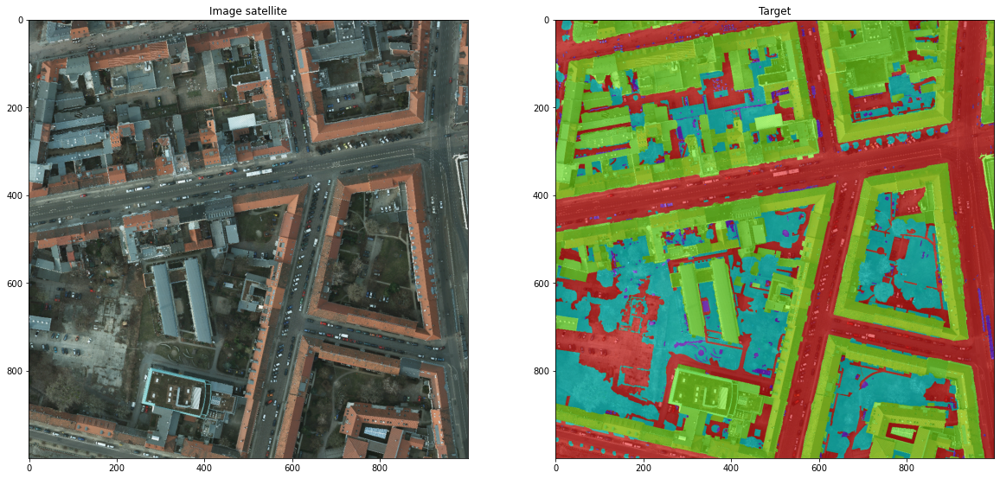

IoU and mean IoU:  [1. 1. 1. 1.] 1.0


In [9]:
visualize(image, target)
_, iou = get_metrics(target, target)
print("IoU and mean IoU: ", iou, np.mean(iou))

# Partie entrainement/test

## Architecture du résau de neurones

In [20]:
net = smp.Unet('mobilenet_v2', encoder_weights='imagenet', classes=4, activation=None, encoder_depth=5, decoder_channels=[512, 256, 128, 64,32]).cuda()

On utilise la structure de réseau de neurones U-net, dont la documentation se trouve ici : https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/
Ce réseau de convolution a été utilisé initialement pour des applications de segmentation sémantique dans le milieu biomédical.
Il nous a paru sensé de prendre cette architecture existante pour notre réseau de neurones, car n'ayant pas d'expérience dans le domaine nous voulions opter pour une valeur sûre.

## Définition de la fonction de test

In [25]:
def sliding_window(image, overlap=0, window_size=WINDOW_SIZE):
    """ Slide a window_shape window across the image with an overlap between 0 and 1 """
    assert overlap >= 0 and overlap < 1
    shape_img = image.shape[1]
    step = int((1-overlap) * window_size)
    for x in range(0, shape_img, step):
        if x + window_size > shape_img:
            x = shape_img - window_size
        for y in range(0, shape_img, step):
            if y + window_size > shape_img:
                y = shape_img - window_size
            yield x, y, window_size #return generator of x,y windows size

def grouper(n, iterable):
    """ Browse an iterator by chunk of n elements """
    it = iter(iterable)
    while True:
        chunk = tuple(itertools.islice(it, n))
        if not chunk:
            return
        yield chunk #return generator of size in order to not store each value

def from_coord_to_patch(img, coords):
    """Returns patches of the input image. coords is an output of grouper(n, sliding window(...))"""
    image_patches = [img[:, x : x + w, y : y + w] for x, y, w in coords]
    image_patches = torch.stack(image_patches).float()
    return image_patches

def test(net, test_imgs=test_imgs):
  with torch.no_grad():
    average_score = 0
    metric = []
    correct_sum = 0   # util to compute average accuracy
    for test_img_file in tqdm(test_imgs, total=len(test_imgs)):
        img = torch.from_numpy(cv.imread(test_img_file)[..., ::-1].transpose((2, 0, 1)) / 255).to(DEVICE)
        target = cv.imread(test_img_file.replace("imgs", "gts"), 0)
        pred = np.zeros(img.shape[1:] + (N_CLASSES,))
        for coords in grouper(BATCH_SIZE, sliding_window(img, overlap=OVERLAP, window_size=WINDOW_SIZE)):
            data_patches = from_coord_to_patch(img, coords)
            outs = net(data_patches).data.cpu().numpy()

            for out, (x, y, w) in zip(outs, coords):
                out = out.transpose((1, 2, 0))
                pred[x : x + w, y : y + w] += out
        pred = np.argmax(pred, axis=-1)
        _,loss = get_metrics(target,pred)
        score = visualize(cv.imread(test_img_file)[..., ::-1]/255,target,pred,True)
        average_score += score
        metric.append(np.mean(loss))
        # Accuracy computation
        test = target-pred
        f1 = np.vectorize(lambda x : 1 if x == 0 else 0)
        new_mask = f1(test)
    print("average score : " + str(average_score/len(test_imgs)))

    return sum(metric)/len(metric)
            
        


    


## Test du dernier modèle enregistré

In [1]:
test_net = torch.load("models/best_model.h5")
test_net.eval().cuda()
result = test(test_net,test_imgs)


NameError: name 'torch' is not defined

## Boucle d'entrainement

In [22]:

train_dataset = Potsdam_train_dataset(train_imgs)
train_dataloader = torch.utils.data.DataLoader(train_dataset,batch_size=BATCH_SIZE)
net.train().cuda()

criterion = nn.CrossEntropyLoss()
i = 0
min = 400
best_model = None
val = 0.00005
for data in tqdm(train_dataloader, total=LENGTH_EPOCH // BATCH_SIZE):
  img, target = data
  img = img.to(DEVICE).float()
  target = target.to(DEVICE).long()
  optimizerCNN = optim.Adam(net.parameters(), lr=val)
  pred = net(img)
  loss = criterion(pred,target)
  val = 0.00005 if loss.item() > 0.5 else 0.00001
  if loss.item() < min :
      i+=1
      min = loss.item()
      if i%10 == 0 :
          print("\tloss=",loss) ## on affiche pour valider que ça ne diverge pas
      best_model = copy.deepcopy(net)
  loss.backward()
  optimizerCNN.step()
  
    


  0%|          | 12/4000 [00:06<35:41,  1.86it/s]

	loss= tensor(1.2081, device='cuda:0', grad_fn=<NllLoss2DBackward0>)


  2%|▏         | 77/4000 [00:40<34:16,  1.91it/s]

	loss= tensor(0.5979, device='cuda:0', grad_fn=<NllLoss2DBackward0>)


  6%|▌         | 237/4000 [02:03<33:14,  1.89it/s]

	loss= tensor(0.4224, device='cuda:0', grad_fn=<NllLoss2DBackward0>)


 17%|█▋        | 687/4000 [05:55<28:10,  1.96it/s]

	loss= tensor(0.3369, device='cuda:0', grad_fn=<NllLoss2DBackward0>)


 84%|████████▍ | 3350/4000 [28:51<05:36,  1.93it/s]

	loss= tensor(0.2439, device='cuda:0', grad_fn=<NllLoss2DBackward0>)


100%|██████████| 4000/4000 [34:27<00:00,  1.93it/s]


Le temps d'entraînement total est entre 20 minutes et une heure en fonction de la machine.



## Résultat et sauvegarde

  0%|          | 0/8 [00:00<?, ?it/s]

0.23256519436836243


<ipython-input-27-0f00ab0356b5>:3: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if pred  == []:


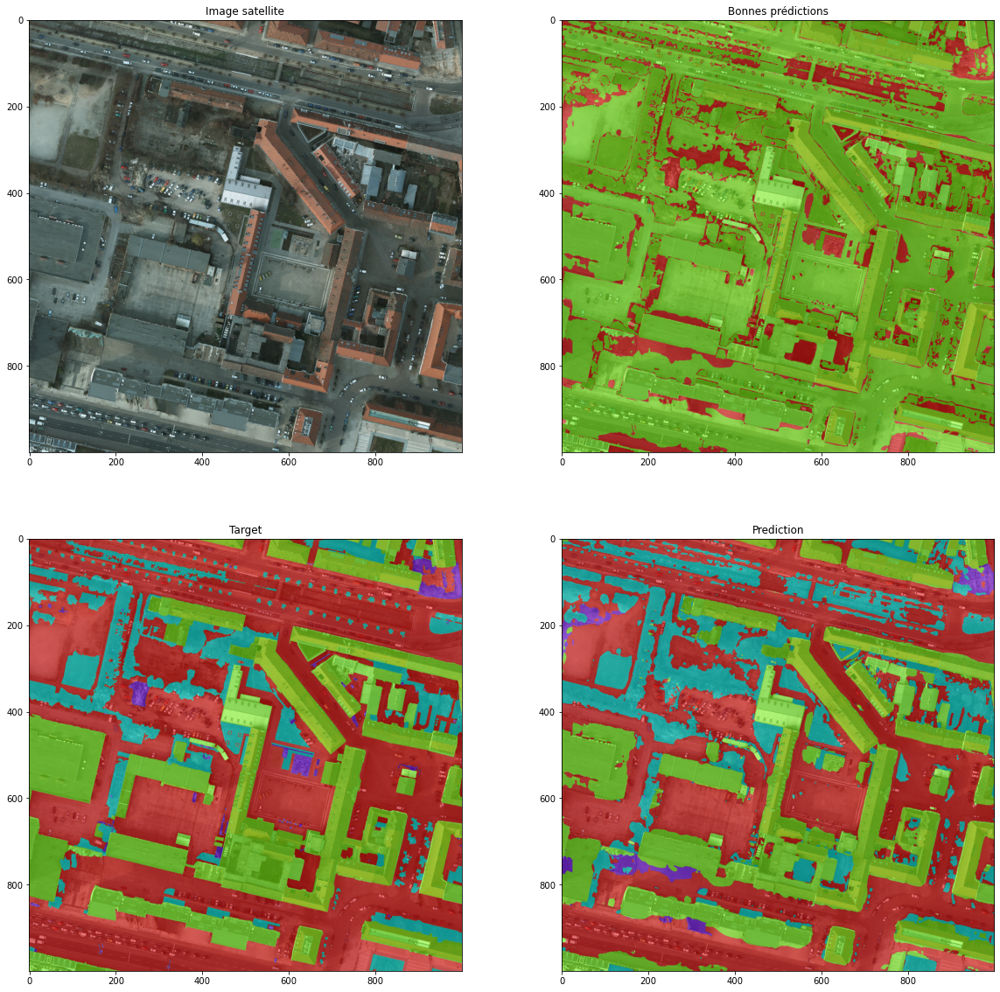

 12%|█▎        | 1/8 [00:38<04:32, 38.92s/it]

accuracy = 84.93 %


<ipython-input-27-0f00ab0356b5>:3: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if pred  == []:


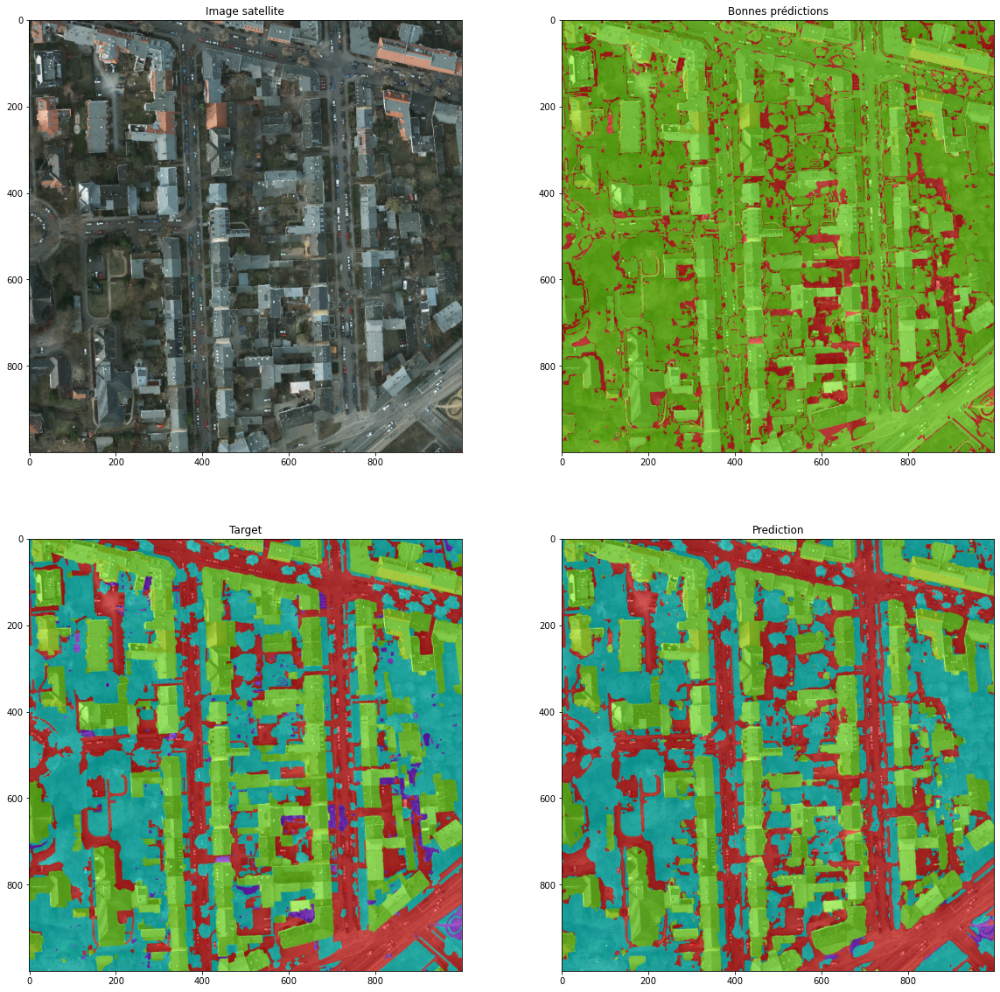

 25%|██▌       | 2/8 [01:18<03:56, 39.36s/it]

accuracy = 85.23 %


<ipython-input-27-0f00ab0356b5>:3: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if pred  == []:


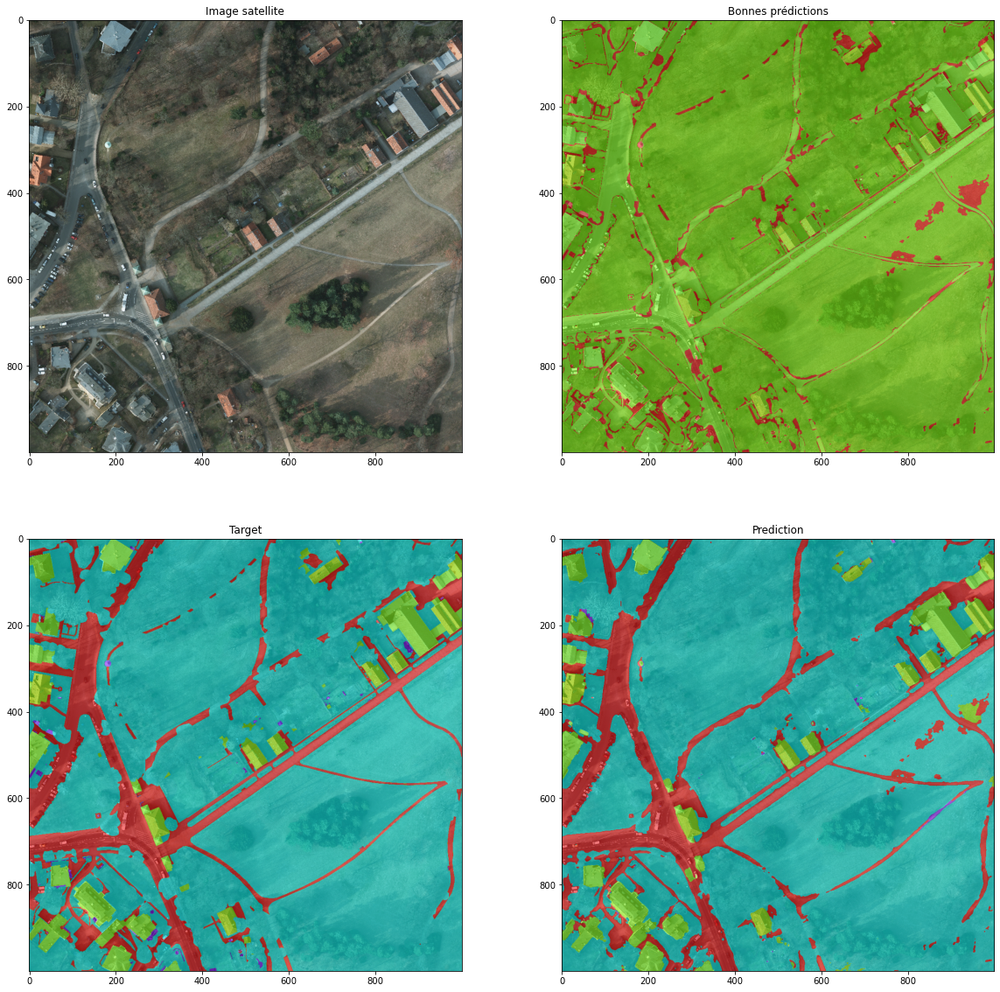

 38%|███▊      | 3/8 [01:57<03:16, 39.34s/it]

accuracy = 93.25 %


<ipython-input-27-0f00ab0356b5>:3: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if pred  == []:


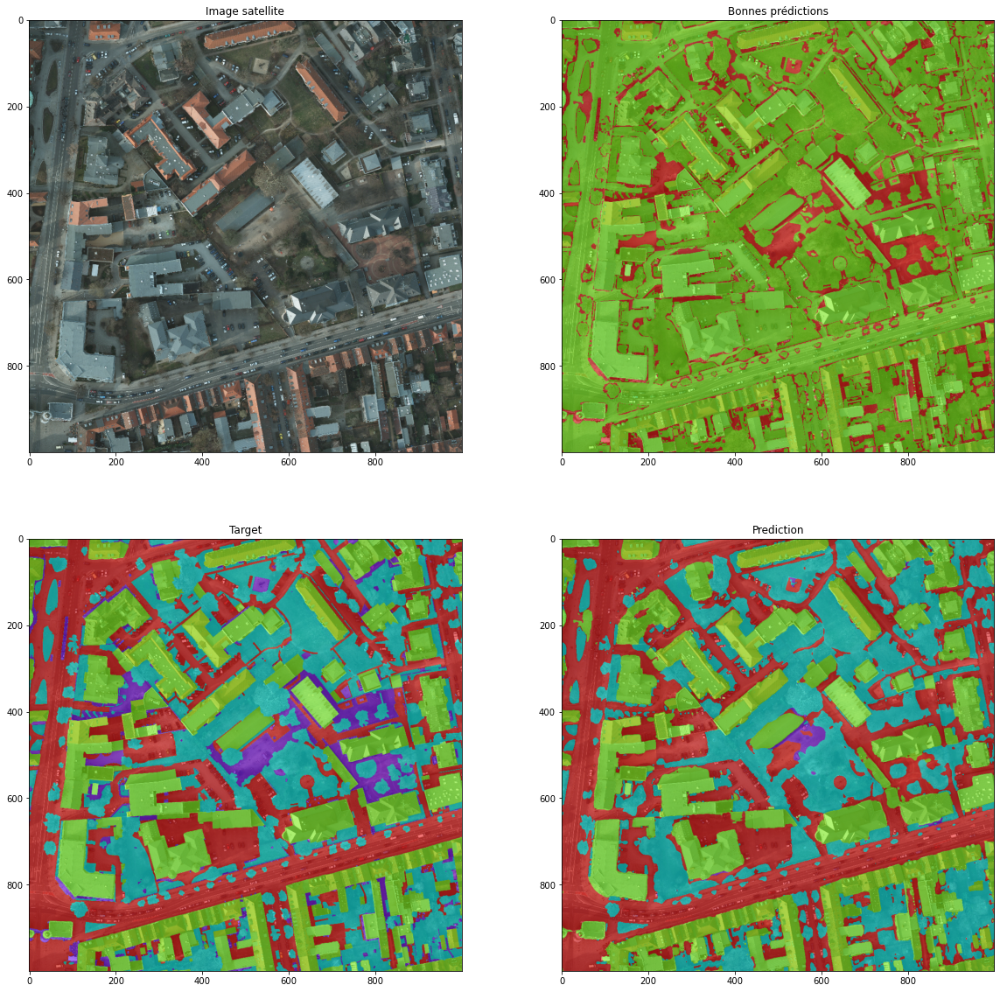

 50%|█████     | 4/8 [02:36<02:36, 39.16s/it]

accuracy = 84.73 %


<ipython-input-27-0f00ab0356b5>:3: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if pred  == []:


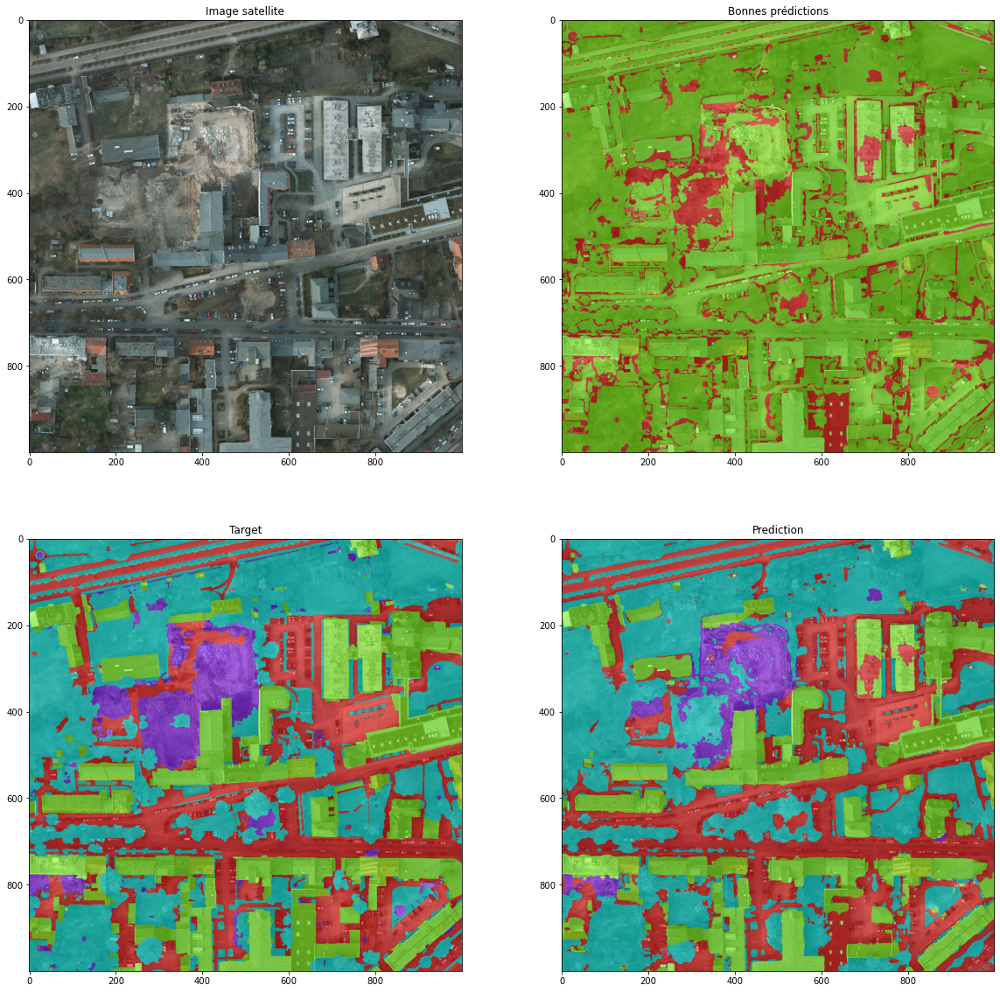

 62%|██████▎   | 5/8 [03:15<01:57, 39.10s/it]

accuracy = 84.14 %


<ipython-input-27-0f00ab0356b5>:3: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if pred  == []:


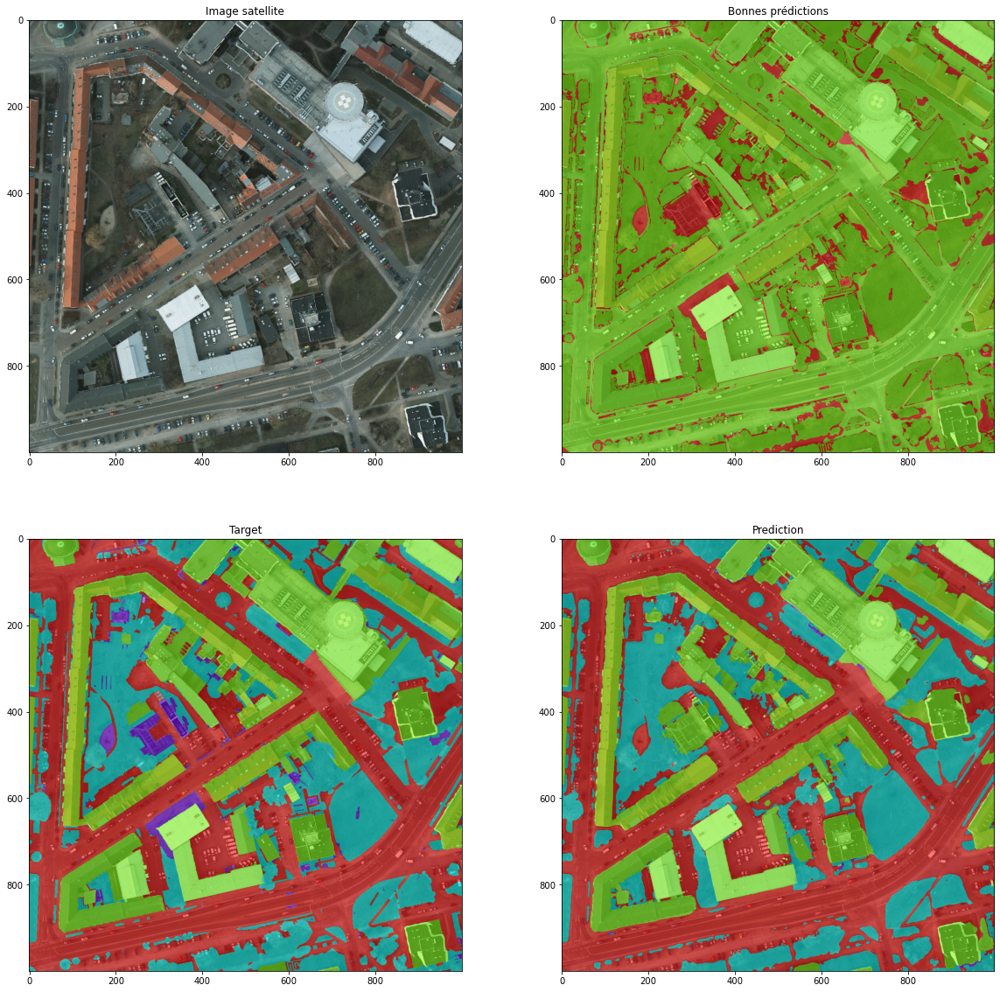

 75%|███████▌  | 6/8 [03:55<01:18, 39.25s/it]

accuracy = 89.23 %


<ipython-input-27-0f00ab0356b5>:3: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if pred  == []:


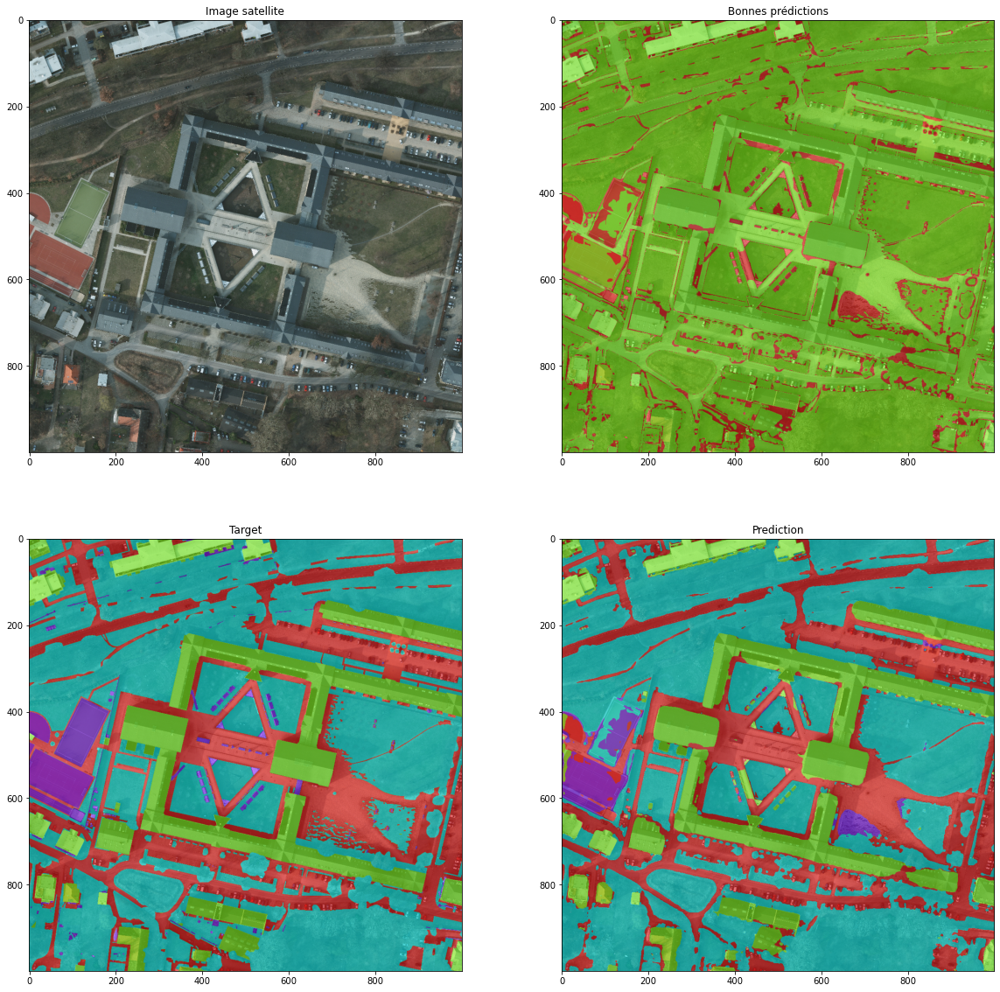

 88%|████████▊ | 7/8 [04:34<00:39, 39.16s/it]

accuracy = 89.5 %


<ipython-input-27-0f00ab0356b5>:3: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if pred  == []:


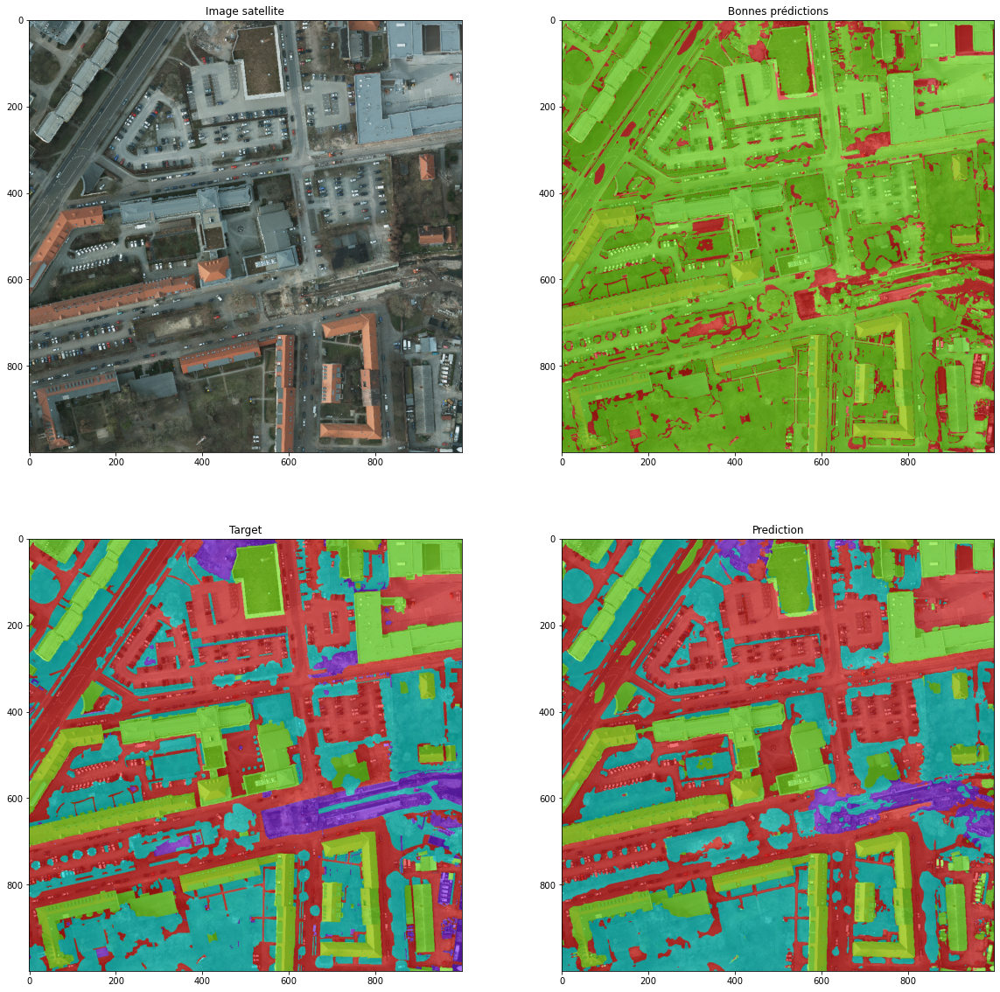

100%|██████████| 8/8 [05:13<00:00, 39.18s/it]

accuracy = 86.31 %
average score : 87.16499999999999
0.6263712928462009


In [28]:
net = best_model
print(min)
net.eval().cuda()
result = test(net,test_imgs)
print( result)


In [24]:

torch.save(net,"models/new_model.h5")